# 生成したデータと重み付けPCA

🧪 4. 実験設計（シミュレーション）
💡 実験目的
ズームに応じた主成分方向の変化・安定性・連続性・可視化解釈性を確認

🔧 実験設定案
① データ構造：
2次元 or 3次元の合成点群データ

グローバルな構造：円環/楕円状など

局所的な興味部分：密度が高いクラスタ or 尾部的構造（曲がり）

② 重み関数：
ガウス型重み（距離に基づく）

ズーム位置 
𝑥
0
x 
0
​
 、スケール 
𝜎
σ を変化させる

③ 比較対象：
通常PCA（重みなし）

Sample Duplication PCA（整数倍重み）

Weighted PCA（連続重み）

Local PCA（局所的近傍を限定）

Kernel PCA（参考）

④ 評価指標：
主成分方向の回転角度の変化（連続性）

分散説明率

可視化の解釈性（主成分空間）

焦点周辺の解像度（Semantic Zoomの観点）

# 様々な分布
【1】基本的・単峰系
分布名	形状の特徴	意味・用途
ガウス分布（多変量正規）	楕円状	PCAの基本モデル。主成分軸が明確
等方性ノイズ	球状に分布	無構造な背景の比較
長軸楕円分布	主成分が一方向に偏る	主軸方向の安定性評価に使える

【2】複数クラスタ・複合構造
分布名	形状の特徴	意味・用途
混合ガウス分布（GMM）	複数の楕円が独立に存在	複数焦点／クラスタの分離評価
同一直線上のクラスタ	主成分がクラスタ中心をつなぐ	焦点によって主成分が変わる
線形＋ノイズ	直線分布にノイズがある	主成分とズーム位置の敏感性確認

【3】非線形構造
分布名	形状の特徴	意味・用途
S字型カーブ	非線形曲線に沿って分布	通常PCAが失敗しやすく、局所PCAとの比較に有効
スパイラル	渦巻き構造	Local PCA/Kernel PCAの効果検証
半月状（Two moons）	左右対称な非線形	判別的構造 vs 線形圧縮の評価

【4】幾何構造付き
分布名	形状の特徴	意味・用途
円環状（リング）	中央に穴のある構造	中心と周辺の焦点ズーム比較に使える
グリッド配置	等間隔点群	人工的なズーム効果の評価
放射型分布	中心からのびる軸に沿って	局所ズーム vs 大局性の評価に便利

【5】密度変化付き（semantic zoom特化）
分布名	形状の特徴	意味・用途
密中心型	中心ほど密度が高い	ズームイン時の強調点検証
フリンジ型	周辺ほど密度が高い	焦点移動による主成分の反転に有効
不均一クラスタ密度	クラスタごとに密度が異なる	重み効果・複製効果の評価対象

【6】人工ノード・グラフ型
分布名	形状の特徴	意味・用途
枝分かれ構造	木構造的に展開	ズームによる方向の分岐確認に使える
スター型構造	中心から多数の放射クラスタ	PCAでは中庸な方向しか見えない課題を示せる
ローカル曲面上の点群	曲がった2次元面	Kernel PCAとの比較に有効

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs, make_moons, make_circles
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

# リストに格納する分布のコレクション
distributions = []

# 【1】基本的・単峰系
# 1.1 ガウス分布（多変量正規）
n_samples = 500
dim = 5  # 5次元で生成

# 楕円状の共分散行列を作成
cov_matrix = np.eye(dim)
cov_matrix[0, 0] = 3  # 第一主成分の分散を大きくする
cov_matrix[1, 1] = 2  # 第二主成分も少し大きく

# 多変量正規分布のサンプル生成
mvn_data = np.random.multivariate_normal(
    mean=np.zeros(dim), 
    cov=cov_matrix, 
    size=n_samples
)
distributions.append({
    'name': 'Gaussian Distribution',
    'data': mvn_data,
    'description': '多変量正規分布（楕円状）- PCAの基本モデル',
    'category': '基本的・単峰系'
})

# 1.2 等方性ノイズ
isotropic_data = np.random.normal(0, 1, size=(n_samples, dim))
distributions.append({
    'name': 'Isotropic Noise',
    'data': isotropic_data,
    'description': '等方性ノイズ - 無構造な背景の比較',
    'category': '基本的・単峰系'
})

# 1.3 長軸楕円分布
# 第一主成分の分散をさらに大きく
elongated_cov = np.eye(dim)
elongated_cov[0, 0] = 10  # 第一主成分を非常に強調
elongated_data = np.random.multivariate_normal(
    mean=np.zeros(dim), 
    cov=elongated_cov, 
    size=n_samples
)
distributions.append({
    'name': 'Elongated Elliptical',
    'data': elongated_data,
    'description': '長軸楕円分布 - 主軸方向の安定性評価',
    'category': '基本的・単峰系'
})

# 【2】複数クラスタ・複合構造
# 2.1 混合ガウス分布（GMM）
centers = [
    np.array([5, 5, 0, 0, 0]),
    np.array([-5, -5, 0, 0, 0]),
    np.array([0, 0, 5, 5, 0]),
    np.array([0, 0, -5, -5, 0])
]
gmm_data = np.vstack([
    np.random.multivariate_normal(center, np.eye(dim), n_samples // 4)
    for center in centers
])
gmm_labels = np.repeat(range(4), n_samples // 4)
distributions.append({
    'name': 'Gaussian Mixture Model',
    'data': gmm_data,
    'clusters': gmm_labels,
    'description': '混合ガウス分布 - 複数の独立した楕円クラスタ',
    'category': '複数クラスタ・複合構造'
})

# 2.2 同一直線上のクラスタ
# 直線に沿って3つのクラスタを配置
line_centers = [
    np.array([-8, 0, 0, 0, 0]),
    np.array([0, 0, 0, 0, 0]),
    np.array([8, 0, 0, 0, 0])
]
linear_clusters_data = np.vstack([
    np.random.multivariate_normal(center, np.eye(dim) * 0.8, n_samples // 3)
    for center in line_centers
])
linear_clusters_labels = np.repeat(range(3), n_samples // 3)
distributions.append({
    'name': 'Linear Aligned Clusters',
    'data': linear_clusters_data,
    'clusters': linear_clusters_labels,
    'description': '同一直線上のクラスタ - 主成分がクラスタ中心をつなぐ',
    'category': '複数クラスタ・複合構造'
})

# 2.3 線形＋ノイズ
# 直線状の構造にノイズを加える
t = np.random.uniform(-5, 5, n_samples)
linear_base = np.zeros((n_samples, dim))
linear_base[:, 0] = t
linear_base[:, 1] = t * 0.5
# ノイズを追加
linear_noise_data = linear_base + np.random.normal(0, 0.8, size=(n_samples, dim))
distributions.append({
    'name': 'Linear with Noise',
    'data': linear_noise_data,
    'description': '線形＋ノイズ - 主成分とズーム位置の敏感性確認',
    'category': '複数クラスタ・複合構造'
})

# 【3】非線形構造
# 3.1 S字型カーブ
t = np.random.uniform(-3, 3, n_samples)
s_curve_base = np.zeros((n_samples, dim))
s_curve_base[:, 0] = t
s_curve_base[:, 1] = 0.5 * np.sin(2 * t)
# 残りの次元にノイズを追加
s_curve_data = s_curve_base + np.random.normal(0, 0.3, size=(n_samples, dim))
distributions.append({
    'name': 'S-Curve',
    'data': s_curve_data,
    'description': 'S字型カーブ - 非線形曲線に沿った分布',
    'category': '非線形構造'
})

# 3.2 スパイラル
theta = np.random.uniform(0, 4*np.pi, n_samples)
r = theta + np.random.normal(0, 0.2, n_samples)
spiral_base = np.zeros((n_samples, dim))
spiral_base[:, 0] = r * np.cos(theta)
spiral_base[:, 1] = r * np.sin(theta)
# 残りの次元にノイズを追加
spiral_data = spiral_base + np.random.normal(0, 0.3, size=(n_samples, dim))
distributions.append({
    'name': 'Spiral',
    'data': spiral_data,
    'description': 'スパイラル - 渦巻き構造',
    'category': '非線形構造'
})

# 3.3 半月状（Two moons）
X_moons, y_moons = make_moons(n_samples=n_samples, noise=0.1, random_state=42)
# 高次元に拡張
moons_data = np.zeros((n_samples, dim))
moons_data[:, :2] = X_moons
moons_data[:, 2:] = np.random.normal(0, 0.1, size=(n_samples, dim-2))
distributions.append({
    'name': 'Two Moons',
    'data': moons_data,
    'clusters': y_moons,
    'description': '半月状 - 左右対称な非線形構造',
    'category': '非線形構造'
})

# 【4】幾何構造付き
# 4.1 円環状（リング）
X_circles, y_circles = make_circles(n_samples=n_samples, noise=0.05, factor=0.5, random_state=42)
# 高次元に拡張
circles_data = np.zeros((n_samples, dim))
circles_data[:, :2] = X_circles
circles_data[:, 2:] = np.random.normal(0, 0.1, size=(n_samples, dim-2))
distributions.append({
    'name': 'Ring',
    'data': circles_data,
    'clusters': y_circles,
    'description': '円環状 - 中央に穴のある構造',
    'category': '幾何構造付き'
})

# 4.2 グリッド配置
# 2次元グリッドを生成
grid_side = int(np.sqrt(n_samples))
x = np.linspace(-5, 5, grid_side)
y = np.linspace(-5, 5, grid_side)
xx, yy = np.meshgrid(x, y)
grid_base = np.column_stack([xx.ravel(), yy.ravel()])
# 高次元に拡張
grid_data = np.zeros((len(grid_base), dim))
grid_data[:, :2] = grid_base
grid_data[:, 2:] = np.random.normal(0, 0.1, size=(len(grid_base), dim-2))
distributions.append({
    'name': 'Grid',
    'data': grid_data[:n_samples],  # サンプル数に合わせる
    'description': 'グリッド配置 - 等間隔点群',
    'category': '幾何構造付き'
})

# 4.3 放射型分布
theta = np.random.uniform(0, 2*np.pi, n_samples)
r = np.random.uniform(0, 5, n_samples)
radial_base = np.zeros((n_samples, dim))
radial_base[:, 0] = r * np.cos(theta)
radial_base[:, 1] = r * np.sin(theta)
# 残りの次元にノイズを追加
radial_data = radial_base + np.random.normal(0, 0.2, size=(n_samples, dim))
distributions.append({
    'name': 'Radial',
    'data': radial_data,
    'description': '放射型分布 - 中心からのびる軸に沿った分布',
    'category': '幾何構造付き'
})

# 【5】密度変化付き
# 5.1 密中心型
# 中心ほど密度が高くなる分布
r = np.random.exponential(2, n_samples)  # 指数分布で距離を決定
theta = np.random.uniform(0, 2*np.pi, n_samples)
dense_center_base = np.zeros((n_samples, dim))
dense_center_base[:, 0] = r * np.cos(theta)
dense_center_base[:, 1] = r * np.sin(theta)
# 残りの次元にノイズを追加
dense_center_data = dense_center_base + np.random.normal(0, 0.2, size=(n_samples, dim))
distributions.append({
    'name': 'Dense Center',
    'data': dense_center_data,
    'description': '密中心型 - 中心ほど密度が高い',
    'category': '密度変化付き'
})

# 5.2 フリンジ型
# 周辺ほど密度が高くなる分布
r = 5 - np.random.exponential(2, n_samples)  # 反転した指数分布
r = np.maximum(r, 0.1)  # 最小値を設定
theta = np.random.uniform(0, 2*np.pi, n_samples)
fringe_base = np.zeros((n_samples, dim))
fringe_base[:, 0] = r * np.cos(theta)
fringe_base[:, 1] = r * np.sin(theta)
# 残りの次元にノイズを追加
fringe_data = fringe_base + np.random.normal(0, 0.2, size=(n_samples, dim))
distributions.append({
    'name': 'Fringe',
    'data': fringe_data,
    'description': 'フリンジ型 - 周辺ほど密度が高い',
    'category': '密度変化付き'
})

# 5.3 不均一クラスタ密度
# 密度の異なる3つのクラスタ
n1, n2, n3 = n_samples // 2, n_samples // 3, n_samples - (n_samples // 2 + n_samples // 3)
cluster1 = np.random.normal(-3, 0.3, size=(n1, dim))  # 高密度・小クラスタ
cluster2 = np.random.normal(0, 1.0, size=(n2, dim))   # 中密度・中クラスタ
cluster3 = np.random.normal(4, 2.0, size=(n3, dim))   # 低密度・大クラスタ
uneven_density_data = np.vstack([cluster1, cluster2, cluster3])
uneven_density_labels = np.concatenate([np.zeros(n1), np.ones(n2), np.ones(n3)*2])
distributions.append({
    'name': 'Uneven Cluster Density',
    'data': uneven_density_data,
    'clusters': uneven_density_labels,
    'description': '不均一クラスタ密度 - クラスタごとに密度が異なる',
    'category': '密度変化付き'
})

# 【6】人工ノード・グラフ型
# 6.1 枝分かれ構造
# メインの幹と3つの枝
t = np.linspace(0, 5, n_samples // 4)
trunk = np.column_stack([t, np.zeros_like(t), np.zeros_like(t)])
branch1 = np.column_stack([5 + t*0.5, t, np.zeros_like(t)])
branch2 = np.column_stack([5 + t*0.5, -t, np.zeros_like(t)])
branch3 = np.column_stack([5 + t*0.5, np.zeros_like(t), t])

tree_structure_base = np.vstack([trunk, branch1, branch2, branch3])
# 高次元に拡張してノイズ追加
tree_structure_data = np.zeros((len(tree_structure_base), dim))
tree_structure_data[:, :3] = tree_structure_base
tree_structure_data[:, 3:] = np.random.normal(0, 0.2, size=(len(tree_structure_base), dim-3))
tree_structure_labels = np.repeat(range(4), n_samples // 4)
distributions.append({
    'name': 'Tree Structure',
    'data': tree_structure_data,
    'clusters': tree_structure_labels,
    'description': '枝分かれ構造 - ズームによる方向の分岐確認',
    'category': '人工ノード・グラフ型'
})

# 6.2 スター型構造
# 中心から放射する複数のクラスタ
n_rays = 8
angle_step = 2 * np.pi / n_rays
n_per_ray = n_samples // n_rays

star_data = []
star_labels = []
for i in range(n_rays):
    angle = i * angle_step
    direction = np.array([np.cos(angle), np.sin(angle)] + [0] * (dim-2))
    # 中心から外側に向かって一定の点
    t = np.linspace(0.5, 5, n_per_ray).reshape(-1, 1)
    ray_points = t * direction
    # ノイズを少し加える
    ray_points += np.random.normal(0, 0.1, size=ray_points.shape)
    star_data.append(ray_points)
    star_labels.append(np.ones(n_per_ray) * i)

star_data = np.vstack(star_data)
star_labels = np.concatenate(star_labels)
distributions.append({
    'name': 'Star Structure',
    'data': star_data,
    'clusters': star_labels,
    'description': 'スター型構造 - 中心から多数の放射クラスタ',
    'category': '人工ノード・グラフ型'
})

# 6.3 ローカル曲面上の点群
# 3次元空間の曲面
u = np.random.uniform(-1, 1, n_samples)
v = np.random.uniform(-1, 1, n_samples)
curved_surface_base = np.zeros((n_samples, dim))
curved_surface_base[:, 0] = u
curved_surface_base[:, 1] = v
curved_surface_base[:, 2] = u**2 - v**2  # 鞍点型の曲面
# 残りの次元にノイズを追加
curved_surface_data = curved_surface_base + np.random.normal(0, 0.1, size=(n_samples, dim))
distributions.append({
    'name': 'Curved Surface',
    'data': curved_surface_data,
    'description': 'ローカル曲面上の点群 - 曲がった2次元面',
    'category': '人工ノード・グラフ型'
})

In [4]:
for dist in distributions:
    print(len(dist["data"][0]))

5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5


In [18]:
# pcaによる可視化, 3列でscatter plotを作成
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.decomposition import PCA

fig = make_subplots(rows=len(distributions)//3, cols=3)

for index, dist in enumerate(distributions):

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(dist["data"])
    # 累積寄与率を計算
    explained_variance_ratio = pca.explained_variance_ratio_
    fig.add_trace(go.Scatter(
        x=pca_result[:, 0],
        y=pca_result[:, 1],
        mode='markers',
        # color=dist["label"],
        # title=f"PCA Visualization for {dist['name']}",
        # labels={"x": "Principal Component 1", "y": "Principal Component 2"}
    ), row=index//3 + 1, col=index%3 + 1)
    # print(f"{dist['name']} - Explained Variance Ratio: {explained_variance_ratio}")
    print(f"{dist['name']} - Explained Variance Ratio: {sum(explained_variance_ratio)}")

# 各グラフを正方形に
fig.update_layout(
    height=1000, width=1000,
    title_text="PCA Visualization of Various Distributions",
    showlegend=False
)
fig.show()




Gaussian Distribution - Explained Variance Ratio: 0.6176258949649892
Isotropic Noise - Explained Variance Ratio: 0.44275779741227594
Elongated Elliptical - Explained Variance Ratio: 0.7863092930018538
Gaussian Mixture Model - Explained Variance Ratio: 0.9463205237120256
Linear Aligned Clusters - Explained Variance Ratio: 0.9484821467647493
Linear with Noise - Explained Variance Ratio: 0.8595673123447405
S-Curve - Explained Variance Ratio: 0.9262610506662241
Spiral - Explained Variance Ratio: 0.9951106224012216
Two Moons - Explained Variance Ratio: 0.9717592391100305
Ring - Explained Variance Ratio: 0.9567336894749381
Grid - Explained Variance Ratio: 0.9983188599804498
Radial - Explained Variance Ratio: 0.9854391574734898
Dense Center - Explained Variance Ratio: 0.9874350651275248
Fringe - Explained Variance Ratio: 0.9902103315905153
Uneven Cluster Density - Explained Variance Ratio: 0.9264792875235792
Tree Structure - Explained Variance Ratio: 0.8474334747436305
Star Structure - Explai

# 重み付けPCA

In [90]:
len(distributions)

25

In [91]:

def weighted_pca():

    high_dim_data = distributions[selected_dist_index]["data"]
    import random
    # pca
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(high_dim_data)


    # Target(pca_resultの1点をランダムに選択)
    target_index = random.randint(0, len(pca_result)-1)
    # target = pca_result[target_index, :]
    target = high_dim_data[target_index, :]
    print(f"Target index: {target_index}")


    # 距離を計算
    distances = np.linalg.norm(high_dim_data - target, axis=1)

    # 正規化
    distances = distances / np.max(distances)  # 最大値で正規化
    fig_distance = px.histogram(x=distances, nbins=50, title="Distance from Target Point")
    fig_distance.show()


    # 重み付け 
    sigmas = np.linspace(4, 0.2, 50) # 
    def gaussian(x, mu, sigma):
        return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)
    weights = [gaussian(distances, mu=0, sigma=sigma) for sigma in sigmas] 





    weighted_data = [high_dim_data * weight[:, np.newaxis] for weight in weights]
    results = []
    explained_variance_ratios = []
    for i in range(len(weighted_data)):
        pca = PCA(n_components=2)
        results.append(pca.fit_transform(weighted_data[i]))
        explained_variance_ratios.append(sum(pca.explained_variance_ratio_))
    
    fig_explain_cariance_ratios = px.line(x=list(range(len(sigmas))), y=explained_variance_ratios, 
        labels={'x':'σ', 'y': 'Explained Variance Ratio'},
        title="Explained Variance Ratio by PCA with Weighted Data")
    fig_explain_cariance_ratios.show()

    # results = [PCA(n_components=2).fit_transform(data) for data in weighted_data]


    # 符号の統一
    for i in range(len(results)):
        results[i][:, 0] *= np.sign(pca_result[:, 0])
        results[i][:, 1] *= np.sign(pca_result[:, 1])

    #  procrustes解析
    from scipy.spatial import procrustes

    for i in range(len(results)):
        _, results[i], _ = procrustes(pca_result, results[i])
        # scale補正
        # results[i] = results[i] * np.linalg.norm(pca_result) / np.linalg.norm(results[i])



    normalized_weight = [weight / np.max(weight) for weight in weights]

    # 点の移動距離を計算
    distances_moved = [np.linalg.norm(results[i+1] - results[i]) for i in range(len(results)-1)]
    fig_distances_moved = px.line(y=distances_moved, title="Distance Moved by PCA with Weighted Data")
    fig_distances_moved.show()

    # colormap for mnist 0-9 to を適当な色にマップする
    color_map = px.colors.qualitative.Plotly


    # 初期フレーム
    fig = go.Figure()

    # Add initial scatter plot
    fig.add_trace(go.Scatter(
        x=results[0][:, 0],
        y=results[0][:, 1],
        mode='markers',
    ))

    # Add target point
    fig.add_trace(go.Scatter(
        x=[results[0][target_index, 0]],
        y=[results[0][target_index, 1]],
        mode='markers',
        marker=dict(size=10, color='red'),
        name='Target Point'
    ))

    # Create frames for animation
    frames = [
        go.Frame(
            data=[
                go.Scatter(
                    x=results[i][:, 0],
                    y=results[i][:, 1],
                    mode='markers',
                    marker=dict(size=normalized_weight[i]*10),
                
                ),
                go.Scatter(
                    x=[results[i][target_index, 0]],
                    y=[results[i][target_index, 1]],
                    mode='markers',
                    marker=dict(size=10, color='red')
                )
            ],
            name=f'frame_{i}'  # フレームに名前を設定
        )
        for i in range(len(sigmas))
    ]

    fig.frames = frames

    # Add slider
    sliders = [
        {
            "steps": [
                {
                    "args": [[f'frame_{i}'], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
                    "label": f'{sigmas[i]:.2f}',
                    "method": "animate"
                }
                for i in range(len(sigmas))
            ],
            "transition": {"duration": 0},
            "x": 0.1,
            "y": 0,
            "currentvalue": {"font": {"size": 20}, "prefix": "σ: ", "visible": True, "xanchor": "center"},
            "len": 0.9
        }
    ]

    fig.update_layout(
        sliders=sliders,
        updatemenus=[
            {
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 100, "redraw": True}, "fromcurrent": True}],
                        "label": "Play",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
                        "label": "Pause",
                        "method": "animate"
                    }
                ],
                "direction": "left",
                "pad": {"r": 10, "t": 87},
                "showactive": False,
                "type": "buttons",
                "x": 0.1,
                "xanchor": "right",
                "y": 0,
                "yanchor": "top"
            }
        ]
        # 正方形に
        ,
        width=800,
        height=800,
    )

    fig.show()



    # weightsのアニメーション
    fig_weight_animation = go.Figure(
        data=[go.Scatter(x=sigmas, y=weights[0], mode='markers', name=f'sigma={sigmas[0]:.2f}')],
        layout=go.Layout(
            title="Gaussian Function: σ Varies",
            xaxis=dict(range=[0, 2]),
            yaxis=dict(range=[0, 1.2]),
            updatemenus=[dict(
                type="buttons",
                buttons=[dict(label="Play",
                            method="animate",
                            args=[None, {"frame": {"duration": 100, "redraw": True},
                                        "fromcurrent": True}])]
            )]
        ),
        frames=[go.Frame(
            data=[go.Scatter(x=sigmas, y=weights[i], mode='markers')],
            name=str(i),
            layout=go.Layout(title_text=f"σ = {sigma:.2f}")
        ) for i, sigma in enumerate(sigmas)]

    )
    fig_weight_animation.show()

selected_dist_index = 24  # 選択した分布のインデックス

weighted_pca()

Target index: 230


In [109]:
# 多峰な分布を生成, 10以上のクラスタ, 5次元
distributions.append({
    'name': 'Multimodal Distribution',
    'data': np.concatenate([
        np.random.multivariate_normal(mean=np.random.rand(5) * 10, cov=np.eye(5), size=n_samples // 10)
        for _ in range(10)
    ]),
    'description': '多峰な分布 - 複数のピークを持つ分布',
    'category': '複数クラスタ・複合構造'
})

pca = PCA(n_components=2)
pca_results = distributions[-1]['data']
fig = px.scatter(pca.fit_transform(pca_results), 
                 x=0, y=1, 
                 title=distributions[-1]['name'], 
                 labels={'x': 'PC1', 'y': 'PC2'})
print(f"{distributions[-1]['name']} - Explained Variance Ratio: {sum(pca.explained_variance_ratio_)}")
print(pca.explained_variance_ratio_)
fig.show()

Multimodal Distribution - Explained Variance Ratio: 0.7246600619537489
[0.47110321 0.25355685]


In [ ]:
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784', version=1, as_frame=False)

In [120]:

num_sample = 1000
dist = mnist.data[:num_sample]
distributions.append({
    'name': 'MNIST',
    'data': dist,
    'description': 'MNISTデータセット - 手書き数字の画像データ',
    'category': '基本的・単峰系'
})



In [125]:
pca = PCA(n_components=2)
pca_results = distributions[-1]['data']
fig = px.scatter(pca.fit_transform(pca_results), 
                 x=0, y=1, 
                 title=distributions[-1]['name'], 
                 labels={'x': 'PC1', 'y': 'PC2'})
print(f"{distributions[-1]['name']} - Explained Variance Ratio: {sum(pca.explained_variance_ratio_)}")
print(pca.explained_variance_ratio_)
fig.show()

MNIST - Explained Variance Ratio: 0.17687607694315152
[0.09931776 0.07755832]


In [122]:

def weighted_pca():

    high_dim_data = distributions[selected_dist_index]["data"]
    import random
    # pca
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(high_dim_data)


    # Target(pca_resultの1点をランダムに選択)
    target_index = random.randint(0, len(pca_result)-1)
    target = high_dim_data[target_index, :]
    print(f"Target index: {target_index}")

    # 距離を計算
    distances = np.linalg.norm(high_dim_data - target, axis=1)

    # 正規化
    distances = distances / np.max(distances)  # 最大値で正規化
    fig_distance = px.histogram(x=distances, nbins=50, title="Distance from Target Point")
    fig_distance.show()


    # 重み付け 
    sigmas = np.linspace(4, 0.2, 50) # 
    def gaussian(x, mu, sigma):
        return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mu) / sigma) ** 2)
        # return np.exp(-0.5 * (distances / sigma) ** 2)
    weights = [gaussian(distances, mu=0, sigma=sigma) for sigma in sigmas] 

    # weighted_data = [high_dim_data * weight[:, np.newaxis] for weight in weights]
    results = []
    explained_variance_ratios = []
    for i in range(len(weights)):
        mu_w = np.average(high_dim_data, axis=0, weights=weights[i])
        X_centered = high_dim_data - mu_w
        weighted_cov = np.cov(X_centered.T, aweights=weights[i])
        
        eigenvalues, eigenvectors = np.linalg.eig(weighted_cov)

        sorted_indices = np.argsort(eigenvalues)[::-1]
        sorted_eigenvalues = eigenvalues[sorted_indices]
        sorted_eigenvectors = eigenvectors[:, sorted_indices]
        # 上位2つの主成分を取得
        top_eigenvectors = sorted_eigenvectors[:, :2]
        # 主成分に投影
        pca_result = X_centered @ top_eigenvectors

        
        results.append(pca_result)
        explained_variance_ratio = sum(sorted_eigenvalues[:2]) / sum(sorted_eigenvalues)
        # 実数値に変換
        explained_variance_ratio = float(explained_variance_ratio)
        explained_variance_ratios.append(explained_variance_ratio)
    
    fig_explain_cariance_ratios = px.line(x=list(range(len(sigmas))), y=explained_variance_ratios, 
        labels={'x':'σ', 'y': 'Explained Variance Ratio'},
        title="Explained Variance Ratio by PCA with Weighted Data")
    fig_explain_cariance_ratios.show()

    # results = [PCA(n_components=2).fit_transform(data) for data in weighted_data]


    # 符号の統一
    for i in range(len(results)):
        results[i][:, 0] *= np.sign(pca_result[:, 0])
        results[i][:, 1] *= np.sign(pca_result[:, 1])

    #  procrustes解析
    from scipy.spatial import procrustes

    for i in range(len(results)):
        _, results[i], _ = procrustes(pca_result, results[i])
        # scale補正
        # results[i] = results[i] * np.linalg.norm(pca_result) / np.linalg.norm(results[i])



    normalized_weight = [weight / np.max(weight) for weight in weights]

    # 点の移動距離を計算
    distances_moved = [np.linalg.norm(results[i+1] - results[i]) for i in range(len(results)-1)]
    fig_distances_moved = px.line(y=distances_moved, title="Distance Moved by PCA with Weighted Data")
    fig_distances_moved.show()

    # colormap for mnist 0-9 to を適当な色にマップする
    color_map = px.colors.qualitative.Plotly


    # 初期フレーム
    fig = go.Figure()

    # Add initial scatter plot
    fig.add_trace(go.Scatter(
        x=results[0][:, 0],
        y=results[0][:, 1],
        mode='markers',
    ))

    # Add target point
    fig.add_trace(go.Scatter(
        x=[results[0][target_index, 0]],
        y=[results[0][target_index, 1]],
        mode='markers',
        marker=dict(size=10, color='red'),
        name='Target Point'
    ))

    # Create frames for animation
    frames = [
        go.Frame(
            data=[
                go.Scatter(
                    x=results[i][:, 0],
                    y=results[i][:, 1],
                    mode='markers',
                    marker=dict(size=normalized_weight[i]*10),
                
                ),
                go.Scatter(
                    x=[results[i][target_index, 0]],
                    y=[results[i][target_index, 1]],
                    mode='markers',
                    marker=dict(size=10, color='red')
                )
            ],
            name=f'frame_{i}'  # フレームに名前を設定
        )
        for i in range(len(sigmas))
    ]

    fig.frames = frames

    # Add slider
    sliders = [
        {
            "steps": [
                {
                    "args": [[f'frame_{i}'], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
                    "label": f'{sigmas[i]:.2f}',
                    "method": "animate"
                }
                for i in range(len(sigmas))
            ],
            "transition": {"duration": 0},
            "x": 0.1,
            "y": 0,
            "currentvalue": {"font": {"size": 20}, "prefix": "σ: ", "visible": True, "xanchor": "center"},
            "len": 0.9
        }
    ]

    fig.update_layout(
        sliders=sliders,
        updatemenus=[
            {
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 100, "redraw": True}, "fromcurrent": True}],
                        "label": "Play",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
                        "label": "Pause",
                        "method": "animate"
                    }
                ],
                "direction": "left",
                "pad": {"r": 10, "t": 87},
                "showactive": False,
                "type": "buttons",
                "x": 0.1,
                "xanchor": "right",
                "y": 0,
                "yanchor": "top"
            }
        ]
        # 正方形に
        ,
        width=800,
        height=800,
    )

    fig.show()



    # weightsのアニメーション
    fig_weight_animation = go.Figure(
        data=[go.Scatter(x=sigmas, y=weights[0], mode='markers', name=f'sigma={sigmas[0]:.2f}')],
        layout=go.Layout(
            title="Gaussian Function: σ Varies",
            xaxis=dict(range=[0, 2]),
            yaxis=dict(range=[0, 1.2]),
            updatemenus=[dict(
                type="buttons",
                buttons=[dict(label="Play",
                            method="animate",
                            args=[None, {"frame": {"duration": 100, "redraw": True},
                                        "fromcurrent": True}])]
            )]
        ),
        frames=[go.Frame(
            data=[go.Scatter(x=sigmas, y=weights[i], mode='markers')],
            name=str(i),
            layout=go.Layout(title_text=f"σ = {sigma:.2f}")
        ) for i, sigma in enumerate(sigmas)]

    )
    fig_weight_animation.show()

selected_dist_index = -1  # 選択した分布のインデックス

weighted_pca()

Target index: 344


C:\Users\acero\AppData\Local\Temp\ipykernel_7656\1251548194.py:53: ComplexWarning:

Casting complex values to real discards the imaginary part



c:\Users\acero\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\spatial\_procrustes.py:100: ComplexWarning:

Casting complex values to real discards the imaginary part

c:\Users\acero\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\spatial\_procrustes.py:101: ComplexWarning:

Casting complex values to real discards the imaginary part



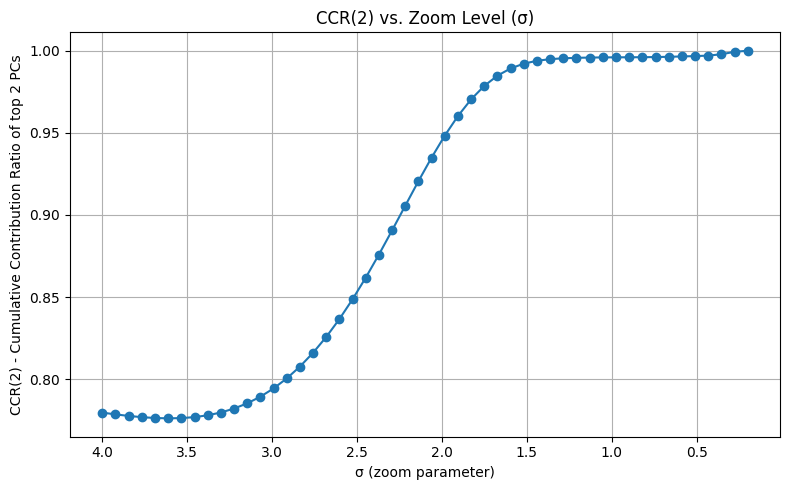

In [124]:
# 必要なライブラリを再インポート
from sklearn.datasets import make_swiss_roll
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# スイスロールデータ生成（非線形性のあるデータ）
n_samples = 5000
data, _ = make_swiss_roll(n_samples=n_samples, noise=0.1)
data = data[:, [0, 2, 1]]  # x, z, yの順（3次元）

# 任意のターゲット点をランダムに選ぶ
np.random.seed(42)
target_index = np.random.randint(0, len(data))
target = data[target_index]

# σのリスト（大きい値から小さい値へ＝ズームイン）
sigmas = np.linspace(4.0, 0.2, 50)

# 距離を計算
distances = np.linalg.norm(data - target, axis=1)

# 重み付きデータでPCA & CCR(2)を計算
ccr_2_list = []
for sigma in sigmas:
    weights = np.exp(-0.5 * (distances / sigma) ** 2)
    weights /= weights.sum()
    weighted_mean = np.average(data, axis=0, weights=weights)
    centered_data = data - weighted_mean
    weighted_cov = np.cov(centered_data.T, aweights=weights)
    
    eigvals, _ = np.linalg.eigh(weighted_cov)
    eigvals = np.flip(np.sort(eigvals))  # 固有値を大きい順に並べ替え

    ccr_2 = np.sum(eigvals[:2]) / np.sum(eigvals)
    ccr_2_list.append(ccr_2)

# グラフ描画
plt.figure(figsize=(8, 5))
plt.plot(sigmas, ccr_2_list, marker='o')
plt.xlabel("σ (zoom parameter)")
plt.ylabel("CCR(2) - Cumulative Contribution Ratio of top 2 PCs")
plt.title("CCR(2) vs. Zoom Level (σ)")
plt.gca().invert_xaxis()  # 小さいσが右（ズームイン）になるよう反転
plt.grid(True)
plt.tight_layout()
plt.show()
